In [1]:
import sys
import os

sys.path.append(os.path.dirname(os.getcwd()))

In [2]:
from sp_utils import update_config, pose_estimation, save_model

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from PIL import Image
from rich import print
import os

In [ ]:
import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms
from torchvision.ops import roi_align

In [5]:
# Device-Agnostic
DeviceLikeType = 'cuda' if torch.cuda.is_available() else 'cpu'
device = torch.device(DeviceLikeType)
print(f"""
Device: {device}
Device CUDNN enabled: {torch.backends.cudnn.enabled}
""")

Device: cuda
Device CUDNN enabled: True

In [ ]:
IMG_WIDTH = 320
IMG_HEIGHT = 240
NUM_KEYPOINTS = 7
NUM_BATCH = 16

CONFIG_PATH = "config.json"
MODEL_PATH = "models/pose_estimation"
DATASET_ROOT = "datasets"
TRAIN_DATASET_FILE = DATASET_ROOT + "/train_dataset.csv"
TEST_DATASET_FILE = DATASET_ROOT + "/test_dataset.csv"


train_df = pd.read_csv(TRAIN_DATASET_FILE)
test_df = pd.read_csv(TEST_DATASET_FILE)

In [7]:
train_df.head()

,behavior,image_id,image_file,head_x,head_y,beak_base_x,beak_base_y,beak_tip_x,beak_tip_y,neck_x,neck_y,body1_x,body1_y,body2_x,body2_y,tail_base_x,tail_base_y
0,0,n_001,59-20151230231705-00.jpg,19.234443,92.112384,41.246921,134.089668,39.711167,149.447212,61.211727,86.993203,79.640779,136.137341,123.153818,131.530078,176.393301,7.133978
1,0,n_001,59-20151230231706-00.jpg,12.579507,49.111263,43.806512,116.684453,55.580628,136.137341,70.426253,83.921694,83.736124,139.208850,145.166297,131.018160,164.619185,5.086305
2,0,n_001,59-20151230231714-00.jpg,24.865542,28.634538,38.175412,83.921694,35.615822,99.279237,61.211727,54.742362,86.295715,137.161177,139.535198,132.553914,193.286599,5.086305
3,0,n_001,59-20151230231720-00.jpg,23.841705,105.934174,38.175412,120.267882,42.270757,127.946653,49.949529,112.589110,73.497762,132.553916,111.379702,121.291718,126.225327,-0.544792
4,0,n_001,59-20151230231721-00.jpg,26.913214,101.838830,37.151576,117.708291,44.318430,125.387062,51.997201,109.005683,66.842826,139.720769,104.212848,131.018162,141.070952,3.550553


In [8]:
# Q. Why nn.SiLU (Swish Activation) [ f(x) = x * sigmoid(x) ]
# A. Allows smooth, non-monotonic behavior, enhancing gradient flow

# class BirdPoseModel(nn.Module):
#     def __init__(self, num_keypoints: int, name = "efficientnet_b0_batch_norm2d_swish"):
#         self.name = name
#         super(BirdPoseModel, self).__init__()
        
#         # Efficient backbone (EfficientNet-B0) for feature extraction
#         efficientnet = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
#         self.backbone = nn.Sequential(*list(efficientnet.features))
        
#         # Reduce feature map channel sizes
#         self.conv_layers = nn.Sequential(
#             nn.Conv2d(1280, 1024, kernel_size=3, padding=1),  # From EfficientNet-B0 last layer (1280 channels)
#             nn.BatchNorm2d(128),
#             nn.SiLU(),  # Swish Activation
#             nn.Conv2d(128, 64, kernel_size=3, padding=1),
#             nn.BatchNorm2d(64),
#             nn.SiLU()
#         )
        
#         # Global average pooling
#         self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        
#         # Fully connected layer for keypoints prediction
#         self.fc = nn.Sequential(
#             nn.Dropout(0.3),  # Add dropout for regularization
#             nn.Linear(64, num_keypoints * 2),
#         )

#     def forward(self, x: torch.Tensor) -> torch.Tensor:
#         # Feature extraction
#         x = self.backbone(x)
        
#         # Channel size reduction
#         x = self.conv_layers(x)
        
#         # Global average pooling
#         x = self.global_avg_pool(x)  # Shape: (batch_size, 64, 1, 1)
#         x = torch.flatten(x, 1)  # Shape: (batch_size, 64)
        
#         # Fully connected layer for keypoints
#         x = self.fc(x)  # Shape: (batch_size, num_keypoints * 2)
#         return x


In [9]:
# class BirdPoseModel(nn.Module):
#     def __init__(self, num_keypoints: int, name = "first_resnet50"):
#         super(BirdPoseModel, self).__init__()
#         self.name = name
#         resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        
#         # Use all layers except the last two
#         self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        
#         # Reduce the output channel size
#         self.conv = nn.Conv2d(2048, 512, kernel_size=3, padding=1)
        
#         # Global average pooling for spatial dimensions
#         self.global_avg_pool = nn.AdaptiveAvgPool2d(1)

#         # Fully connected layer for final predictions
#         self.fc = nn.Linear(512, num_keypoints * 2)

#     def forward(self, x: torch.Tensor) -> torch.Tensor:
#         # Pass through the backbone
#         x = self.backbone(x)
        
#         # Apply convolutional layer
#         x = self.conv(x)
#         x = nn.ReLU()(x)
        
#         # Global average pooling
#         x = self.global_avg_pool(x)  # Shape: (batch_size, 512, 1, 1)
#         x = torch.flatten(x, 1)  # Shape: (batch_size, 512)
        
#         # Fully connected layer for keypoints
#         x = self.fc(x)  # Shape: (batch_size, num_keypoints * 2)
        
#         # Reshape to (batch_size, num_keypoints * 2)
#         return x.view(-1, NUM_KEYPOINTS * 2)

In [10]:
# class BirdPoseModel(nn.Module):
#     def __init__(self, num_keypoints: int, name = "resnet50_relu"): # "resnet50_batch_norm2d_relu"
#         super(BirdPoseModel, self).__init__()
#         self.name = name
        
#         # Load ResNet-50 backbone and remove the last two layers
#         resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
#         self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        
#         # Reduce the channel size progressively
#         self.conv_layers = nn.Sequential(
#             nn.Conv2d(2048, 1024, kernel_size=3, padding=1),
#             nn.BatchNorm2d(1024),
#             nn.ReLU(),
#             nn.Conv2d(1024, 512, kernel_size=3, padding=1),
#             nn.BatchNorm2d(512),
#             nn.ReLU(),
#             nn.Conv2d(512, 256, kernel_size=3, padding=1),
#             nn.BatchNorm2d(256),
#             nn.ReLU(),
#             nn.Conv2d(256, 64, kernel_size=3, padding=1),
#             nn.BatchNorm2d(64),
#             nn.ReLU()
#         )
        
#         # Global average pooling
#         self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        
#         # Fully connected layer for keypoints
#         self.fc = nn.Linear(64, num_keypoints * 2)

#     def forward(self, x: torch.Tensor) -> torch.Tensor:
#         # Pass input through the ResNet backbone
#         x = self.backbone(x)
        
#         # Apply the convolutional layers
#         x = self.conv_layers(x)
        
#         # Global average pooling
#         x = self.global_avg_pool(x)  # Shape: (batch_size, 64, 1, 1)
#         x = torch.flatten(x, 1)  # Shape: (batch_size, 64)
        
#         # Fully connected layer for keypoint prediction
#         x = self.fc(x)  # Shape: (batch_size, num_keypoints * 2)
        
#         return x


In [11]:
class BirdPoseModel(nn.Module):
    def __init__(self, num_keypoints: int, name="resnet50_batch_norm2d_swish_dropout"):
        super(BirdPoseModel, self).__init__()
        self.name = name
        
        # Load ResNet-50 backbone and remove the last two layers
        resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        
        # Reduce the channel size progressively with BatchNorm, SiLU, and Dropout
        self.conv_layers = nn.Sequential(
            nn.Conv2d(2048, 1024, kernel_size=3, padding=1),
            nn.BatchNorm2d(1024),
            nn.SiLU(),
            nn.Dropout(p=0.3),
            
            nn.Conv2d(1024, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.SiLU(),
            nn.Dropout(p=0.3),
            
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.SiLU(),
            nn.Dropout(p=0.3),
            
            nn.Conv2d(256, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.SiLU(),
            nn.Dropout(p=0.3)
        )
        
        # Global average pooling
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        
        # Fully connected layer for keypoints
        self.fc = nn.Linear(64, num_keypoints * 2)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Pass input through the ResNet backbone
        x = self.backbone(x)
        
        # Apply the convolutional layers
        x = self.conv_layers(x)
        
        # Global average pooling
        x = self.global_avg_pool(x)  # Shape: (batch_size, 64, 1, 1)
        x = torch.flatten(x, 1)  # Shape: (batch_size, 64)
        
        # Fully connected layer for keypoint prediction
        x = self.fc(x)  # Shape: (batch_size, num_keypoints * 2)
        
        return x


In [ ]:
# Image Transformations Defination
img_transform = transforms.Compose([
    transforms.Resize((IMG_HEIGHT, IMG_WIDTH)),
    transforms.ToTensor(),
])

kp_transform = pose_estimation.NormalizeKeypoints(IMG_WIDTH, IMG_HEIGHT)

# Create datasets
train_dataset = pose_estimation.PoseDataset(
    dataframe=train_df, 
    dataset_root_folder=DATASET_ROOT, 
    img_transform=img_transform, 
    kp_transform=kp_transform
)

test_dataset = pose_estimation.PoseDataset(
    dataframe=test_df, 
    dataset_root_folder=DATASET_ROOT, 
    img_transform=img_transform, 
    kp_transform=kp_transform
)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=NUM_BATCH, shuffle=True, num_workers=0, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=NUM_BATCH, shuffle=False, num_workers=0, pin_memory=True)

In [13]:
model = BirdPoseModel(NUM_KEYPOINTS).to(device)

In [14]:
# Why scaling?: 
# If you want to accumulate the loss over multiple batches,
# you need to ensure that each batch contributes the correct amount to the total loss,
# regardless of the batch size. Multiplying by images.size(0) gives the total loss for that batch instead of just the average.

In [15]:
EPOCHS = 200
LEARNING_RATE = 1e-5
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
criterion = nn.MSELoss()

In [16]:
# Loss Calculation
# ----------------

# Batch Loss = Loss per Sample * Batch Size
# Epoch Loss = Total Batch Losses / Number Of Samples in Dataset
# Loss Percentage = (batch loss / max loss) % 100

In [17]:
from tqdm import tqdm

# Initialize the maximum observed batch loss
max_batch_loss = float('-inf')

for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0

    with tqdm(train_loader, desc=f'Epoch {epoch + 1}/{EPOCHS}', unit='batch') as pbar:
        for batch in train_loader:
            images, keypoints = batch[0].to(device), batch[1].to(device)

            optimizer.zero_grad()  # Clear gradients
            outputs = model(images)
            loss = criterion(outputs, keypoints)
            
            loss.backward()  # Backpropagation
            optimizer.step()  # Update parameters
            
            batch_loss = loss.item() * images.size(0)  # Accumulate batch loss (scaled)
            running_loss += batch_loss
            
            # Update the maximum batch loss observed so far
            max_batch_loss = max(max_batch_loss, batch_loss)
            
            # Calculate percentage loss relative to max_batch_loss
            loss_percentage = (batch_loss / max_batch_loss) * 100 if max_batch_loss > 0 else 0
            
            pbar.update(1)
            pbar.set_postfix(batch_loss=batch_loss, loss_percentage=f"{loss_percentage:.2f}%")

    # Normalize epoch loss and calculate percentage relative to max_batch_loss
    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_loss_percentage = (epoch_loss / max_batch_loss) * 100 if max_batch_loss > 0 else 0
    print(f"Epoch [{epoch + 1}/{EPOCHS}], Epoch Loss: {epoch_loss:.4f}, Max Batch Loss: {max_batch_loss}, Loss Percentage: {epoch_loss_percentage:.2f}%")

Epoch 1/200:   0%|          | 0/73 [00:00<?, ?batch/s]

Epoch 1/200: 100%|██████████| 73/73 [00:35<00:00,  2.04batch/s, batch_loss=4, loss_percentage=59.33%]    


Epoch [1/200], Epoch Loss: 0.3540, Max Batch Loss: 6.7430620193481445, Loss Percentage: 5.25%

Epoch 2/200: 100%|██████████| 73/73 [00:41<00:00,  1.74batch/s, batch_loss=3.36, loss_percentage=49.79%]


Epoch [2/200], Epoch Loss: 0.3324, Max Batch Loss: 6.7430620193481445, Loss Percentage: 4.93%

Epoch 3/200: 100%|██████████| 73/73 [00:41<00:00,  1.77batch/s, batch_loss=3.99, loss_percentage=59.13%]


Epoch [3/200], Epoch Loss: 0.2993, Max Batch Loss: 6.7430620193481445, Loss Percentage: 4.44%

Epoch 4/200: 100%|██████████| 73/73 [00:40<00:00,  1.80batch/s, batch_loss=3.33, loss_percentage=49.39%]


Epoch [4/200], Epoch Loss: 0.2689, Max Batch Loss: 6.7430620193481445, Loss Percentage: 3.99%

Epoch 5/200: 100%|██████████| 73/73 [00:40<00:00,  1.80batch/s, batch_loss=3.18, loss_percentage=47.15%]


Epoch [5/200], Epoch Loss: 0.2505, Max Batch Loss: 6.7430620193481445, Loss Percentage: 3.72%

Epoch 6/200: 100%|██████████| 73/73 [00:40<00:00,  1.81batch/s, batch_loss=2.53, loss_percentage=37.49%]


Epoch [6/200], Epoch Loss: 0.2359, Max Batch Loss: 6.7430620193481445, Loss Percentage: 3.50%

Epoch 7/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=2.55, loss_percentage=37.78%]


Epoch [7/200], Epoch Loss: 0.2246, Max Batch Loss: 6.7430620193481445, Loss Percentage: 3.33%

Epoch 8/200: 100%|██████████| 73/73 [00:40<00:00,  1.81batch/s, batch_loss=2.65, loss_percentage=39.28%]


Epoch [8/200], Epoch Loss: 0.2120, Max Batch Loss: 6.7430620193481445, Loss Percentage: 3.14%

Epoch 9/200: 100%|██████████| 73/73 [00:40<00:00,  1.80batch/s, batch_loss=2.6, loss_percentage=38.63%] 


Epoch [9/200], Epoch Loss: 0.2041, Max Batch Loss: 6.7430620193481445, Loss Percentage: 3.03%

Epoch 10/200: 100%|██████████| 73/73 [00:40<00:00,  1.80batch/s, batch_loss=2.43, loss_percentage=36.01%]


Epoch [10/200], Epoch Loss: 0.1973, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.93%

Epoch 11/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=2.24, loss_percentage=33.15%]


Epoch [11/200], Epoch Loss: 0.1909, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.83%

Epoch 12/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=2.17, loss_percentage=32.16%]


Epoch [12/200], Epoch Loss: 0.1836, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.72%

Epoch 13/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=2.24, loss_percentage=33.20%]


Epoch [13/200], Epoch Loss: 0.1769, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.62%

Epoch 14/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=2.42, loss_percentage=35.96%]


Epoch [14/200], Epoch Loss: 0.1708, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.53%

Epoch 15/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=2.07, loss_percentage=30.66%]


Epoch [15/200], Epoch Loss: 0.1662, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.46%

Epoch 16/200: 100%|██████████| 73/73 [00:40<00:00,  1.80batch/s, batch_loss=2.07, loss_percentage=30.68%]


Epoch [16/200], Epoch Loss: 0.1598, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.37%

Epoch 17/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=2.14, loss_percentage=31.79%]


Epoch [17/200], Epoch Loss: 0.1534, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.27%

Epoch 18/200: 100%|██████████| 73/73 [00:39<00:00,  1.87batch/s, batch_loss=1.76, loss_percentage=26.03%]


Epoch [18/200], Epoch Loss: 0.1483, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.20%

Epoch 19/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=1.99, loss_percentage=29.50%]


Epoch [19/200], Epoch Loss: 0.1420, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.11%

Epoch 20/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=1.32, loss_percentage=19.53%]


Epoch [20/200], Epoch Loss: 0.1362, Max Batch Loss: 6.7430620193481445, Loss Percentage: 2.02%

Epoch 21/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=1.97, loss_percentage=29.22%]


Epoch [21/200], Epoch Loss: 0.1329, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.97%

Epoch 22/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=1.49, loss_percentage=22.05%]


Epoch [22/200], Epoch Loss: 0.1274, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.89%

Epoch 23/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=1.28, loss_percentage=19.03%]


Epoch [23/200], Epoch Loss: 0.1224, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.82%

Epoch 24/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=1.5, loss_percentage=22.20%] 


Epoch [24/200], Epoch Loss: 0.1173, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.74%

Epoch 25/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=1.31, loss_percentage=19.46%]


Epoch [25/200], Epoch Loss: 0.1130, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.68%

Epoch 26/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=1.24, loss_percentage=18.40%]


Epoch [26/200], Epoch Loss: 0.1077, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.60%

Epoch 27/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=1.44, loss_percentage=21.31%]


Epoch [27/200], Epoch Loss: 0.1037, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.54%

Epoch 28/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=1.17, loss_percentage=17.34%]


Epoch [28/200], Epoch Loss: 0.0982, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.46%

Epoch 29/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=1.26, loss_percentage=18.68%]


Epoch [29/200], Epoch Loss: 0.0945, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.40%

Epoch 30/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.907, loss_percentage=13.45%]


Epoch [30/200], Epoch Loss: 0.0907, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.35%

Epoch 31/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=1.03, loss_percentage=15.21%]


Epoch [31/200], Epoch Loss: 0.0861, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.28%

Epoch 32/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.892, loss_percentage=13.22%]


Epoch [32/200], Epoch Loss: 0.0820, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.22%

Epoch 33/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=1.02, loss_percentage=15.14%] 


Epoch [33/200], Epoch Loss: 0.0788, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.17%

Epoch 34/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.898, loss_percentage=13.31%]


Epoch [34/200], Epoch Loss: 0.0745, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.11%

Epoch 35/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.877, loss_percentage=13.01%]


Epoch [35/200], Epoch Loss: 0.0712, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.06%

Epoch 36/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.675, loss_percentage=10.01%]


Epoch [36/200], Epoch Loss: 0.0677, Max Batch Loss: 6.7430620193481445, Loss Percentage: 1.00%

Epoch 37/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.778, loss_percentage=11.54%]


Epoch [37/200], Epoch Loss: 0.0645, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.96%

Epoch 38/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.779, loss_percentage=11.55%]


Epoch [38/200], Epoch Loss: 0.0609, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.90%

Epoch 39/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.833, loss_percentage=12.36%]


Epoch [39/200], Epoch Loss: 0.0578, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.86%

Epoch 40/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.567, loss_percentage=8.41%] 


Epoch [40/200], Epoch Loss: 0.0544, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.81%

Epoch 41/200: 100%|██████████| 73/73 [00:40<00:00,  1.81batch/s, batch_loss=0.661, loss_percentage=9.80%] 


Epoch [41/200], Epoch Loss: 0.0521, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.77%

Epoch 42/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.682, loss_percentage=10.12%]


Epoch [42/200], Epoch Loss: 0.0485, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.72%

Epoch 43/200: 100%|██████████| 73/73 [00:40<00:00,  1.81batch/s, batch_loss=0.633, loss_percentage=9.38%] 


Epoch [43/200], Epoch Loss: 0.0463, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.69%

Epoch 44/200: 100%|██████████| 73/73 [00:40<00:00,  1.81batch/s, batch_loss=0.448, loss_percentage=6.64%] 


Epoch [44/200], Epoch Loss: 0.0432, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.64%

Epoch 45/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.494, loss_percentage=7.33%] 


Epoch [45/200], Epoch Loss: 0.0407, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.60%

Epoch 46/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.338, loss_percentage=5.01%] 


Epoch [46/200], Epoch Loss: 0.0389, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.58%

Epoch 47/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.534, loss_percentage=7.93%] 


Epoch [47/200], Epoch Loss: 0.0368, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.55%

Epoch 48/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.407, loss_percentage=6.03%] 


Epoch [48/200], Epoch Loss: 0.0342, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.51%

Epoch 49/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.308, loss_percentage=4.56%] 


Epoch [49/200], Epoch Loss: 0.0321, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.48%

Epoch 50/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.281, loss_percentage=4.17%] 


Epoch [50/200], Epoch Loss: 0.0303, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.45%

Epoch 51/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.3, loss_percentage=4.44%]   


Epoch [51/200], Epoch Loss: 0.0280, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.42%

Epoch 52/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.231, loss_percentage=3.42%]


Epoch [52/200], Epoch Loss: 0.0264, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.39%

Epoch 53/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.199, loss_percentage=2.95%] 


Epoch [53/200], Epoch Loss: 0.0250, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.37%

Epoch 54/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.346, loss_percentage=5.13%]


Epoch [54/200], Epoch Loss: 0.0233, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.35%

Epoch 55/200: 100%|██████████| 73/73 [00:27<00:00,  2.61batch/s, batch_loss=0.215, loss_percentage=3.20%]


Epoch [55/200], Epoch Loss: 0.0219, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.33%

Epoch 56/200: 100%|██████████| 73/73 [00:32<00:00,  2.23batch/s, batch_loss=0.149, loss_percentage=2.21%]


Epoch [56/200], Epoch Loss: 0.0207, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.31%

Epoch 57/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.214, loss_percentage=3.18%]


Epoch [57/200], Epoch Loss: 0.0195, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.29%

Epoch 58/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.169, loss_percentage=2.51%]


Epoch [58/200], Epoch Loss: 0.0177, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.26%

Epoch 59/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.269, loss_percentage=3.99%]


Epoch [59/200], Epoch Loss: 0.0166, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.25%

Epoch 60/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.196, loss_percentage=2.90%]


Epoch [60/200], Epoch Loss: 0.0159, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.24%

Epoch 61/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.178, loss_percentage=2.64%]


Epoch [61/200], Epoch Loss: 0.0147, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.22%

Epoch 62/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.1, loss_percentage=1.49%]  


Epoch [62/200], Epoch Loss: 0.0135, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.20%

Epoch 63/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.257, loss_percentage=3.81%] 


Epoch [63/200], Epoch Loss: 0.0126, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.19%

Epoch 64/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.115, loss_percentage=1.71%] 


Epoch [64/200], Epoch Loss: 0.0122, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.18%

Epoch 65/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.133, loss_percentage=1.98%] 


Epoch [65/200], Epoch Loss: 0.0113, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.17%

Epoch 66/200: 100%|██████████| 73/73 [00:40<00:00,  1.80batch/s, batch_loss=0.117, loss_percentage=1.73%] 


Epoch [66/200], Epoch Loss: 0.0102, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.15%

Epoch 67/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.13, loss_percentage=1.93%]  


Epoch [67/200], Epoch Loss: 0.0098, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.15%

Epoch 68/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.114, loss_percentage=1.70%] 


Epoch [68/200], Epoch Loss: 0.0094, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.14%

Epoch 69/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0601, loss_percentage=0.89%]


Epoch [69/200], Epoch Loss: 0.0084, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.12%

Epoch 70/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.154, loss_percentage=2.29%] 


Epoch [70/200], Epoch Loss: 0.0086, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.13%

Epoch 71/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.119, loss_percentage=1.77%] 


Epoch [71/200], Epoch Loss: 0.0078, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.12%

Epoch 72/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0454, loss_percentage=0.67%]


Epoch [72/200], Epoch Loss: 0.0071, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.11%

Epoch 73/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0823, loss_percentage=1.22%]


Epoch [73/200], Epoch Loss: 0.0071, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.10%

Epoch 74/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0754, loss_percentage=1.12%]


Epoch [74/200], Epoch Loss: 0.0063, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.09%

Epoch 75/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0834, loss_percentage=1.24%]


Epoch [75/200], Epoch Loss: 0.0061, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.09%

Epoch 76/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0454, loss_percentage=0.67%]


Epoch [76/200], Epoch Loss: 0.0060, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.09%

Epoch 77/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0823, loss_percentage=1.22%]


Epoch [77/200], Epoch Loss: 0.0055, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.08%

Epoch 78/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0566, loss_percentage=0.84%]


Epoch [78/200], Epoch Loss: 0.0052, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.08%

Epoch 79/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0431, loss_percentage=0.64%]


Epoch [79/200], Epoch Loss: 0.0049, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.07%

Epoch 80/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.061, loss_percentage=0.90%] 


Epoch [80/200], Epoch Loss: 0.0049, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.07%

Epoch 81/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0572, loss_percentage=0.85%]


Epoch [81/200], Epoch Loss: 0.0046, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.07%

Epoch 82/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0426, loss_percentage=0.63%]


Epoch [82/200], Epoch Loss: 0.0046, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.07%

Epoch 83/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.108, loss_percentage=1.60%] 


Epoch [83/200], Epoch Loss: 0.0043, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 84/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0677, loss_percentage=1.00%]


Epoch [84/200], Epoch Loss: 0.0042, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 85/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.114, loss_percentage=1.70%] 


Epoch [85/200], Epoch Loss: 0.0040, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 86/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0449, loss_percentage=0.67%]


Epoch [86/200], Epoch Loss: 0.0040, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 87/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0339, loss_percentage=0.50%]


Epoch [87/200], Epoch Loss: 0.0039, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 88/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.114, loss_percentage=1.70%] 


Epoch [88/200], Epoch Loss: 0.0040, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 89/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0853, loss_percentage=1.27%]


Epoch [89/200], Epoch Loss: 0.0040, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 90/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.119, loss_percentage=1.76%] 


Epoch [90/200], Epoch Loss: 0.0036, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 91/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0535, loss_percentage=0.79%]


Epoch [91/200], Epoch Loss: 0.0037, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 92/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0423, loss_percentage=0.63%]


Epoch [92/200], Epoch Loss: 0.0040, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 93/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0495, loss_percentage=0.73%]


Epoch [93/200], Epoch Loss: 0.0034, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 94/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0335, loss_percentage=0.50%]


Epoch [94/200], Epoch Loss: 0.0035, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 95/200: 100%|██████████| 73/73 [00:38<00:00,  1.92batch/s, batch_loss=0.0538, loss_percentage=0.80%]


Epoch [95/200], Epoch Loss: 0.0039, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 96/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0362, loss_percentage=0.54%]


Epoch [96/200], Epoch Loss: 0.0038, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 97/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0315, loss_percentage=0.47%]


Epoch [97/200], Epoch Loss: 0.0035, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 98/200: 100%|██████████| 73/73 [00:36<00:00,  1.99batch/s, batch_loss=0.0446, loss_percentage=0.66%]


Epoch [98/200], Epoch Loss: 0.0033, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 99/200: 100%|██████████| 73/73 [00:23<00:00,  3.06batch/s, batch_loss=0.0477, loss_percentage=0.71%]


Epoch [99/200], Epoch Loss: 0.0036, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 100/200: 100%|██████████| 73/73 [00:23<00:00,  3.07batch/s, batch_loss=0.0911, loss_percentage=1.35%]


Epoch [100/200], Epoch Loss: 0.0034, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 101/200: 100%|██████████| 73/73 [00:23<00:00,  3.07batch/s, batch_loss=0.0487, loss_percentage=0.72%]


Epoch [101/200], Epoch Loss: 0.0032, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 102/200: 100%|██████████| 73/73 [00:39<00:00,  1.86batch/s, batch_loss=0.0307, loss_percentage=0.45%]


Epoch [102/200], Epoch Loss: 0.0035, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 103/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0371, loss_percentage=0.55%]


Epoch [103/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 104/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0674, loss_percentage=1.00%]


Epoch [104/200], Epoch Loss: 0.0037, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 105/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0288, loss_percentage=0.43%]


Epoch [105/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 106/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0582, loss_percentage=0.86%]


Epoch [106/200], Epoch Loss: 0.0033, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 107/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0476, loss_percentage=0.71%]


Epoch [107/200], Epoch Loss: 0.0032, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 108/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0346, loss_percentage=0.51%]


Epoch [108/200], Epoch Loss: 0.0038, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.06%

Epoch 109/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0505, loss_percentage=0.75%]


Epoch [109/200], Epoch Loss: 0.0033, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 110/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0739, loss_percentage=1.10%]


Epoch [110/200], Epoch Loss: 0.0035, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 111/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.036, loss_percentage=0.53%] 


Epoch [111/200], Epoch Loss: 0.0033, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 112/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0258, loss_percentage=0.38%]


Epoch [112/200], Epoch Loss: 0.0033, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 113/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0533, loss_percentage=0.79%]


Epoch [113/200], Epoch Loss: 0.0034, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 114/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0756, loss_percentage=1.12%]


Epoch [114/200], Epoch Loss: 0.0034, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 115/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.0423, loss_percentage=0.63%]


Epoch [115/200], Epoch Loss: 0.0034, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 116/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0304, loss_percentage=0.45%]


Epoch [116/200], Epoch Loss: 0.0036, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 117/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.103, loss_percentage=1.53%] 


Epoch [117/200], Epoch Loss: 0.0034, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 118/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0912, loss_percentage=1.35%]


Epoch [118/200], Epoch Loss: 0.0032, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 119/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0578, loss_percentage=0.86%]


Epoch [119/200], Epoch Loss: 0.0032, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 120/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0689, loss_percentage=1.02%]


Epoch [120/200], Epoch Loss: 0.0034, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 121/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0369, loss_percentage=0.55%]


Epoch [121/200], Epoch Loss: 0.0033, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 122/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.0588, loss_percentage=0.87%]


Epoch [122/200], Epoch Loss: 0.0032, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 123/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0453, loss_percentage=0.67%]


Epoch [123/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 124/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0499, loss_percentage=0.74%]


Epoch [124/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 125/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.0216, loss_percentage=0.32%]


Epoch [125/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 126/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.067, loss_percentage=0.99%] 


Epoch [126/200], Epoch Loss: 0.0033, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 127/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0479, loss_percentage=0.71%]


Epoch [127/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 128/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.031, loss_percentage=0.46%] 


Epoch [128/200], Epoch Loss: 0.0032, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 129/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0404, loss_percentage=0.60%]


Epoch [129/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 130/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0458, loss_percentage=0.68%]


Epoch [130/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 131/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0232, loss_percentage=0.34%]


Epoch [131/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 132/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0304, loss_percentage=0.45%]


Epoch [132/200], Epoch Loss: 0.0033, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 133/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0579, loss_percentage=0.86%]


Epoch [133/200], Epoch Loss: 0.0032, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 134/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0478, loss_percentage=0.71%]


Epoch [134/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 135/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.021, loss_percentage=0.31%] 


Epoch [135/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 136/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.026, loss_percentage=0.39%] 


Epoch [136/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 137/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0377, loss_percentage=0.56%]


Epoch [137/200], Epoch Loss: 0.0030, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 138/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0166, loss_percentage=0.25%]


Epoch [138/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 139/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0196, loss_percentage=0.29%]


Epoch [139/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 140/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0367, loss_percentage=0.54%]


Epoch [140/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 141/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0258, loss_percentage=0.38%]


Epoch [141/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 142/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.041, loss_percentage=0.61%] 


Epoch [142/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 143/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0538, loss_percentage=0.80%]


Epoch [143/200], Epoch Loss: 0.0027, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 144/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0311, loss_percentage=0.46%]


Epoch [144/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 145/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0492, loss_percentage=0.73%]


Epoch [145/200], Epoch Loss: 0.0030, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 146/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0299, loss_percentage=0.44%]


Epoch [146/200], Epoch Loss: 0.0028, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 147/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0342, loss_percentage=0.51%]


Epoch [147/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 148/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0354, loss_percentage=0.53%]


Epoch [148/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 149/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0544, loss_percentage=0.81%]


Epoch [149/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 150/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0595, loss_percentage=0.88%]


Epoch [150/200], Epoch Loss: 0.0031, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.05%

Epoch 151/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0335, loss_percentage=0.50%]


Epoch [151/200], Epoch Loss: 0.0028, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 152/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0236, loss_percentage=0.35%]


Epoch [152/200], Epoch Loss: 0.0027, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 153/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0464, loss_percentage=0.69%]


Epoch [153/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 154/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0351, loss_percentage=0.52%]


Epoch [154/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 155/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0278, loss_percentage=0.41%]


Epoch [155/200], Epoch Loss: 0.0028, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 156/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0423, loss_percentage=0.63%]


Epoch [156/200], Epoch Loss: 0.0028, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 157/200: 100%|██████████| 73/73 [00:39<00:00,  1.85batch/s, batch_loss=0.0182, loss_percentage=0.27%]


Epoch [157/200], Epoch Loss: 0.0028, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 158/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0293, loss_percentage=0.44%]


Epoch [158/200], Epoch Loss: 0.0024, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 159/200: 100%|██████████| 73/73 [00:38<00:00,  1.92batch/s, batch_loss=0.0378, loss_percentage=0.56%]


Epoch [159/200], Epoch Loss: 0.0026, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 160/200: 100%|██████████| 73/73 [00:26<00:00,  2.70batch/s, batch_loss=0.0259, loss_percentage=0.38%]


Epoch [160/200], Epoch Loss: 0.0026, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 161/200: 100%|██████████| 73/73 [00:27<00:00,  2.69batch/s, batch_loss=0.0446, loss_percentage=0.66%]


Epoch [161/200], Epoch Loss: 0.0026, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 162/200: 100%|██████████| 73/73 [00:26<00:00,  2.81batch/s, batch_loss=0.0161, loss_percentage=0.24%]


Epoch [162/200], Epoch Loss: 0.0027, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 163/200: 100%|██████████| 73/73 [00:26<00:00,  2.72batch/s, batch_loss=0.0246, loss_percentage=0.36%]


Epoch [163/200], Epoch Loss: 0.0028, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 164/200: 100%|██████████| 73/73 [00:27<00:00,  2.63batch/s, batch_loss=0.0307, loss_percentage=0.46%]


Epoch [164/200], Epoch Loss: 0.0027, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 165/200: 100%|██████████| 73/73 [00:29<00:00,  2.48batch/s, batch_loss=0.0457, loss_percentage=0.68%]


Epoch [165/200], Epoch Loss: 0.0028, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 166/200: 100%|██████████| 73/73 [00:27<00:00,  2.61batch/s, batch_loss=0.0332, loss_percentage=0.49%]


Epoch [166/200], Epoch Loss: 0.0024, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 167/200: 100%|██████████| 73/73 [00:24<00:00,  2.96batch/s, batch_loss=0.0222, loss_percentage=0.33%]


Epoch [167/200], Epoch Loss: 0.0026, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 168/200: 100%|██████████| 73/73 [00:24<00:00,  3.00batch/s, batch_loss=0.0209, loss_percentage=0.31%]


Epoch [168/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 169/200: 100%|██████████| 73/73 [00:26<00:00,  2.78batch/s, batch_loss=0.0996, loss_percentage=1.48%]


Epoch [169/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 170/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.0335, loss_percentage=0.50%]


Epoch [170/200], Epoch Loss: 0.0024, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 171/200: 100%|██████████| 73/73 [00:28<00:00,  2.59batch/s, batch_loss=0.0382, loss_percentage=0.57%]


Epoch [171/200], Epoch Loss: 0.0029, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 172/200: 100%|██████████| 73/73 [00:25<00:00,  2.84batch/s, batch_loss=0.0169, loss_percentage=0.25%]


Epoch [172/200], Epoch Loss: 0.0027, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 173/200: 100%|██████████| 73/73 [00:23<00:00,  3.11batch/s, batch_loss=0.0203, loss_percentage=0.30%]


Epoch [173/200], Epoch Loss: 0.0027, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 174/200: 100%|██████████| 73/73 [00:26<00:00,  2.72batch/s, batch_loss=0.0231, loss_percentage=0.34%]


Epoch [174/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 175/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0477, loss_percentage=0.71%]


Epoch [175/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 176/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0237, loss_percentage=0.35%]


Epoch [176/200], Epoch Loss: 0.0027, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 177/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0234, loss_percentage=0.35%]


Epoch [177/200], Epoch Loss: 0.0026, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 178/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0323, loss_percentage=0.48%]


Epoch [178/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 179/200: 100%|██████████| 73/73 [00:40<00:00,  1.81batch/s, batch_loss=0.0214, loss_percentage=0.32%]


Epoch [179/200], Epoch Loss: 0.0027, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 180/200: 100%|██████████| 73/73 [00:40<00:00,  1.82batch/s, batch_loss=0.0245, loss_percentage=0.36%]


Epoch [180/200], Epoch Loss: 0.0024, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 181/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.049, loss_percentage=0.73%] 


Epoch [181/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 182/200: 100%|██████████| 73/73 [00:39<00:00,  1.83batch/s, batch_loss=0.0276, loss_percentage=0.41%]


Epoch [182/200], Epoch Loss: 0.0024, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 183/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0636, loss_percentage=0.94%]


Epoch [183/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 184/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0221, loss_percentage=0.33%]


Epoch [184/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 185/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0325, loss_percentage=0.48%]


Epoch [185/200], Epoch Loss: 0.0027, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 186/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0222, loss_percentage=0.33%]


Epoch [186/200], Epoch Loss: 0.0023, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 187/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0276, loss_percentage=0.41%]


Epoch [187/200], Epoch Loss: 0.0023, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 188/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0245, loss_percentage=0.36%]


Epoch [188/200], Epoch Loss: 0.0021, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 189/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0557, loss_percentage=0.83%]


Epoch [189/200], Epoch Loss: 0.0024, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 190/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0345, loss_percentage=0.51%]


Epoch [190/200], Epoch Loss: 0.0024, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 191/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0148, loss_percentage=0.22%]


Epoch [191/200], Epoch Loss: 0.0023, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 192/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0227, loss_percentage=0.34%]


Epoch [192/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 193/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0217, loss_percentage=0.32%]


Epoch [193/200], Epoch Loss: 0.0023, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 194/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0387, loss_percentage=0.57%]


Epoch [194/200], Epoch Loss: 0.0025, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.04%

Epoch 195/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0301, loss_percentage=0.45%]


Epoch [195/200], Epoch Loss: 0.0022, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 196/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.031, loss_percentage=0.46%] 


Epoch [196/200], Epoch Loss: 0.0023, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 197/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0185, loss_percentage=0.27%]


Epoch [197/200], Epoch Loss: 0.0022, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 198/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0297, loss_percentage=0.44%]


Epoch [198/200], Epoch Loss: 0.0023, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 199/200: 100%|██████████| 73/73 [00:39<00:00,  1.84batch/s, batch_loss=0.0413, loss_percentage=0.61%]


Epoch [199/200], Epoch Loss: 0.0023, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

Epoch 200/200: 100%|██████████| 73/73 [00:41<00:00,  1.75batch/s, batch_loss=0.0265, loss_percentage=0.39%]


Epoch [200/200], Epoch Loss: 0.0022, Max Batch Loss: 6.7430620193481445, Loss Percentage: 0.03%

In [18]:
# Discrepancy Between Losses:

# A small epoch loss (average over all samples) and a large maximum batch loss suggest that:
# Some batches have samples that are more challenging for the model to predict (e.g., outliers, noisy labels, or underrepresented behaviors).
# The loss distribution across batches is uneven, and certain batches are dominating the overall loss.

# Potential Issues:

# Outliers or Noise: Some data points might have extreme values causing large losses in specific batches.
# Class Imbalance: Certain behaviors or poses might be underrepresented, leading to higher losses for those batches.

In [19]:
# MODEL SAVE
pe_model = save_model(model, model.name, MODEL_PATH, EPOCHS, LEARNING_RATE, "pe")

## Pose Estimation Testing

In [ ]:
model.eval()
with torch.inference_mode():

    for images, keypoints in test_loader:
        predictions = model(images.to(device))
        print(keypoints.shape)
        break # Single batch of dataset

kp_denormalize = pose_estimation.DenormalizeKeypoints(IMG_WIDTH, IMG_HEIGHT)

for pred, exp in zip(predictions, keypoints):
    print(f"Prediction: {kp_denormalize(pred)}")
    print(f"Expected: {kp_denormalize(exp)}")
    print(f"{'-'* 100}")
    break # Single Dataset

In [21]:
THRESHOLD = 0.1 

model = BirdPoseModel(NUM_KEYPOINTS)
model.load_state_dict(torch.load(pe_model, map_location=device, weights_only=True)) 
# model.load_state_dict(torch.load(os.path.join(MODEL_PATH, "sp_pe_resnet50_batch_norm2d_relu_2024-11-19T21-36.pth"), map_location=device, weights_only=True)) 

model.to(device) 

average_pckh = pose_estimation.pe_accuracy(model, test_loader, device, THRESHOLD)
print(f"Average PCKh: {average_pckh:.2f}%")

Average PCKh: 73.34%

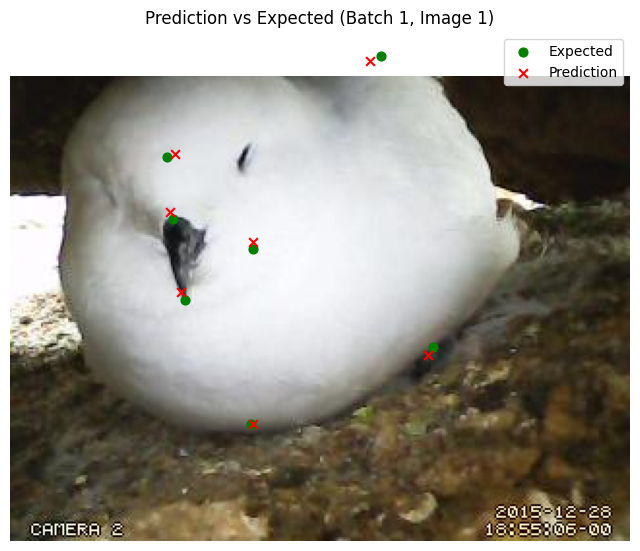

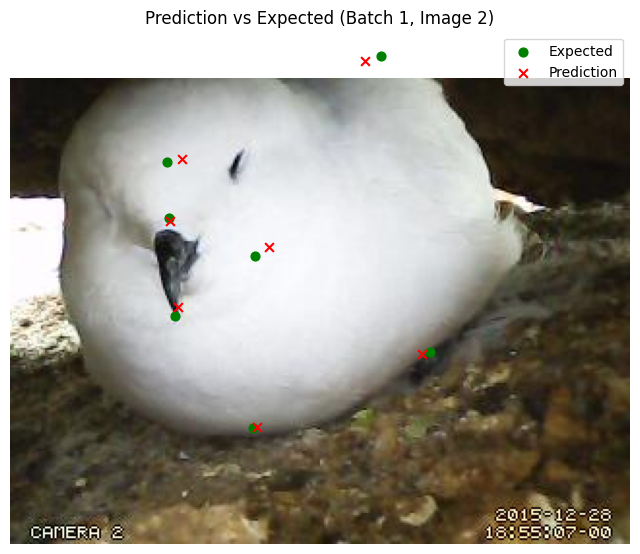

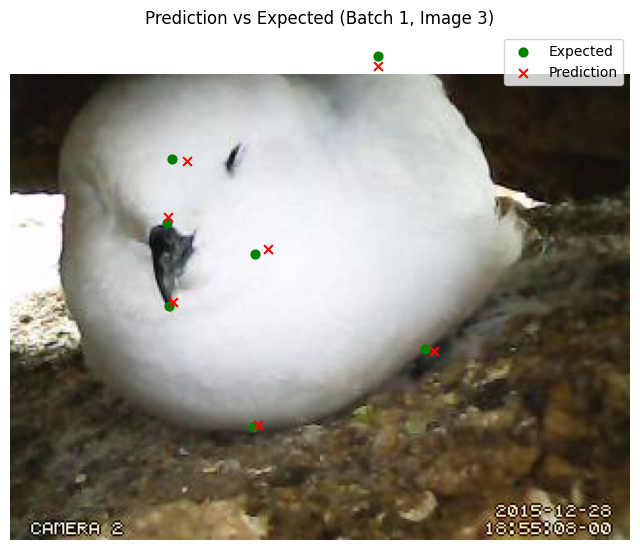

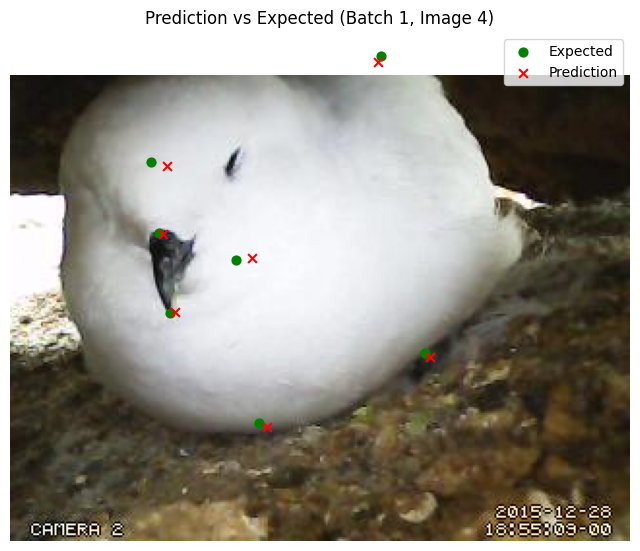

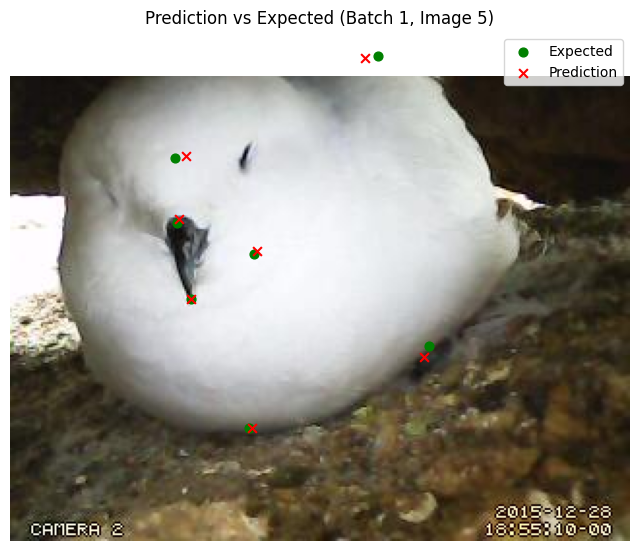

...

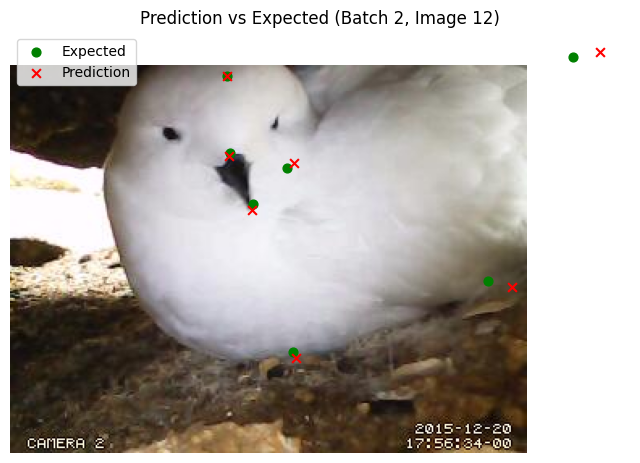

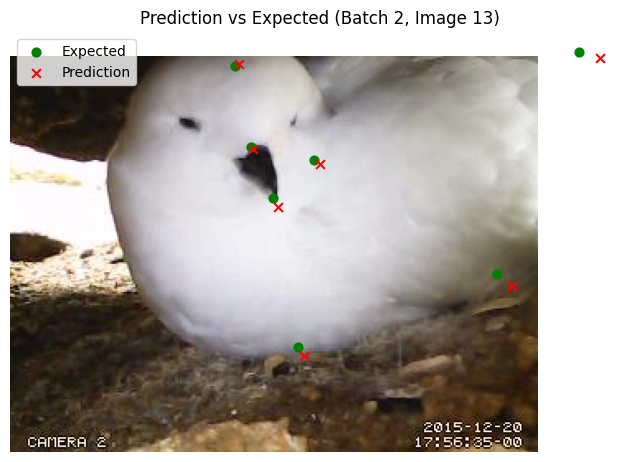

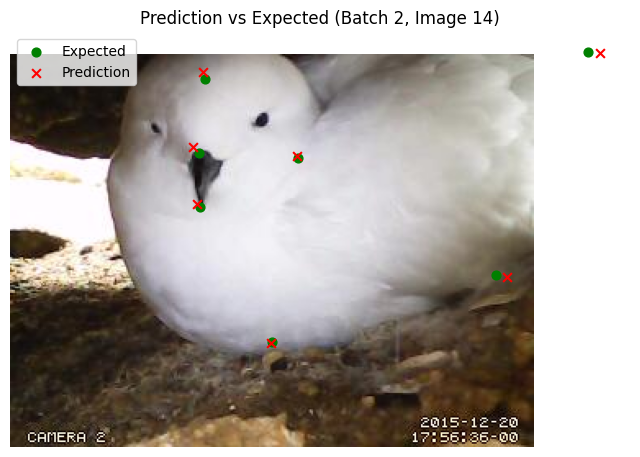

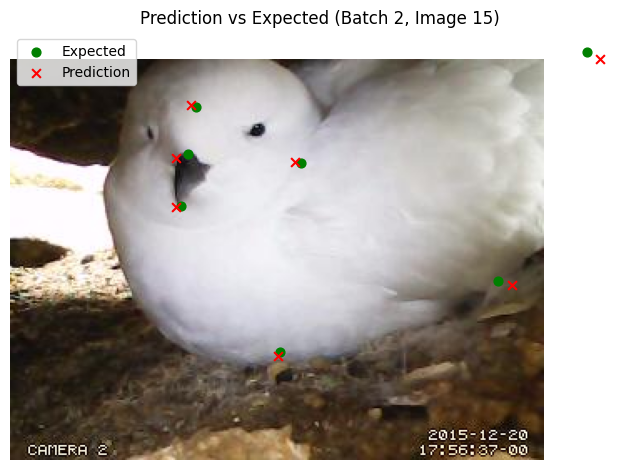

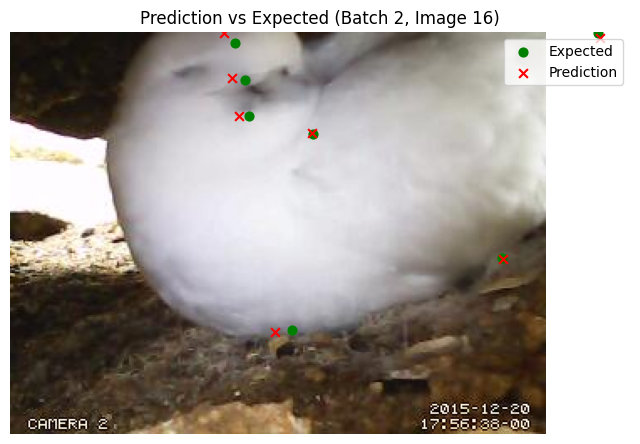

In [22]:
kp_denormalize = pose_estimation.DenormalizeKeypoints(IMG_WIDTH, IMG_HEIGHT)

pose_estimation.plot(model, test_loader, device, kp_denormalize, 2)


## Config Update

In [ ]:

update_config(CONFIG_PATH, "dataset",
{
  'img_width': IMG_WIDTH,
  'img_height': IMG_HEIGHT,
  "num_keypoints": NUM_KEYPOINTS
})


# PCKh (Percentage of Correct Keypoints with Head Normalization)
update_config(CONFIG_PATH, "model", {
    "pose_estimation": {
        "model_file" : pe_model,
        "architecture": model.name,
        "epochs": EPOCHS,
        "batch_size": NUM_BATCH,
        "learning_rate": LEARNING_RATE,
        "optimizer": type(optimizer).__name__,
        "criterion": type(criterion).__name__,
        "evaluation_metric": "PCKh",
        "head_threshold": THRESHOLD,
        "device_like_type": DeviceLikeType,
    }
})

Updated ../config.json dataset successfully.
Updated ../config.json model successfully.
